<a href="https://colab.research.google.com/github/MJKhadeeja/ML-python-Mini-projects/blob/ML-Regression/Flight_ticket_fare_prediction(Mini_project).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Importing Libraries***

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics  # to find accuracy

# ***Importing Data set***

### ***This data set contains the informations about the flights which affects the ticket fare like date,airline,ch_code,num_code,dep_time,from,time taken,stop, arraival time, and the destination place. By using these information I have bulid a ML model and predicted the ticket fare.***

In [2]:
#from google.colab import files
#files.upload()

Saving Aircraft Ticket price data.csv to Aircraft Ticket price data.csv


{'Aircraft Ticket price data.csv': b'\xef\xbb\xbfdate,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price\r\n11/02/2022,Air India,AI,868,18:00,Delhi,02h 00m,non-stop ,20:00,Mumbai,"25,612"\r\n11/02/2022,Air India,AI,624,19:00,Delhi,02h 15m,non-stop ,21:15,Mumbai,"25,612"\r\n11/02/2022,Air India,AI,531,20:00,Delhi,24h 45m,"1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t\t\t\t\t\t\t",20:45,Mumbai,"42,220"\r\n11/02/2022,Air India,AI,839,21:25,Delhi,26h 30m,"1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t\t\t\t\t\t\t",23:55,Mumbai,"44,450"\r\n11/02/2022,Air India,AI,544,17:15,Delhi,06h 40m,"1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t\t\t\t\t\t\t",23:55,Mumbai,"46,690"\r\n11/02/2022,Vistara,UK,985,19:50,Delhi,02h 10m,non-stop ,22:00,Mumbai,"50,264"\r\n11/02/2022,Air India,AI,479,21:15,Delhi,17h 45m,"1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t\t\t\t\t\t\t",15:00,Mumbai,"50,669"\r\n11/02/2022,Air India,AI,473,18:40,Delhi,22h 45m,"1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t

In [3]:
flight=pd.read_csv('Aircraft Ticket price data.csv')
flight

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11/02/2022,Air India,AI,868,18:00,Delhi,02h 00m,non-stop,20:00,Mumbai,"25,612"
1,11/02/2022,Air India,AI,624,19:00,Delhi,02h 15m,non-stop,21:15,Mumbai,"25,612"
2,11/02/2022,Air India,AI,531,20:00,Delhi,24h 45m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220"
3,11/02/2022,Air India,AI,839,21:25,Delhi,26h 30m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450"
4,11/02/2022,Air India,AI,544,17:15,Delhi,06h 40m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690"
...,...,...,...,...,...,...,...,...,...,...,...
93482,31/03/2022,Vistara,UK,822,09:45,Chennai,10h 05m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,19:50,Hyderabad,"69,265"
93483,31/03/2022,Vistara,UK,826,12:30,Chennai,10h 25m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,22:55,Hyderabad,"77,105"
93484,31/03/2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"79,099"
93485,31/03/2022,Vistara,UK,828,07:00,Chennai,10h 00m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,17:00,Hyderabad,"81,585"


# ***Data Processing***

In [4]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93487 entries, 0 to 93486
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   date        93487 non-null  object
 1   airline     93487 non-null  object
 2   ch_code     93487 non-null  object
 3   num_code    93487 non-null  int64 
 4   dep_time    93487 non-null  object
 5   from        93487 non-null  object
 6   time_taken  93487 non-null  object
 7   stop        93487 non-null  object
 8   arr_time    93487 non-null  object
 9   to          93487 non-null  object
 10  price       93487 non-null  object
dtypes: int64(1), object(10)
memory usage: 7.8+ MB


In [5]:
# checking for missing valuez
flight.isnull().sum()

date          0
airline       0
ch_code       0
num_code      0
dep_time      0
from          0
time_taken    0
stop          0
arr_time      0
to            0
price         0
dtype: int64

In [6]:
flight['date']

0        11/02/2022
1        11/02/2022
2        11/02/2022
3        11/02/2022
4        11/02/2022
            ...    
93482    31/03/2022
93483    31/03/2022
93484    31/03/2022
93485    31/03/2022
93486    31/03/2022
Name: date, Length: 93487, dtype: object

In [7]:
# Assuming your date column is named 'date', you can split it into day, month, and year
flight[['day', 'month', 'year']] = flight['date'].str.split('/', expand=True)

# Convert the columns to numeric if needed
flight['day'] = pd.to_numeric(flight['day'])
flight['month'] = pd.to_numeric(flight['month'])
flight['year'] = pd.to_numeric(flight['year'])

In [8]:
# Drop the 'date' column
flight.drop(columns=['date'], inplace=True)

In [9]:
flight

,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,day,month,year
0,Air India,AI,868,18:00,Delhi,02h 00m,non-stop,20:00,Mumbai,"25,612",11,2,2022
1,Air India,AI,624,19:00,Delhi,02h 15m,non-stop,21:15,Mumbai,"25,612",11,2,2022
2,Air India,AI,531,20:00,Delhi,24h 45m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220",11,2,2022
3,Air India,AI,839,21:25,Delhi,26h 30m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450",11,2,2022
4,Air India,AI,544,17:15,Delhi,06h 40m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690",11,2,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93482,Vistara,UK,822,09:45,Chennai,10h 05m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,19:50,Hyderabad,"69,265",31,3,2022
93483,Vistara,UK,826,12:30,Chennai,10h 25m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,22:55,Hyderabad,"77,105",31,3,2022
93484,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"79,099",31,3,2022
93485,Vistara,UK,828,07:00,Chennai,10h 00m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,17:00,Hyderabad,"81,585",31,3,2022


In [10]:
# Define a function to convert time string to float
def convert_time_to_float(time_str):
    if isinstance(time_str, float):
        return time_str  # If the value is already float, return it directly
    hours, minutes = time_str.split('h ')
    hours = float(hours)
    minutes = float(minutes[:-1])  # Remove the 'm' at the end and convert to float
    return hours + (minutes / 60)  # Convert minutes to hours and sum with hours

# Apply the function to the 'time_taken' column
flight['time_taken'] = flight['time_taken'].apply(convert_time_to_float)


In [11]:
flight

,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,day,month,year
0,Air India,AI,868,18:00,Delhi,2.000000,non-stop,20:00,Mumbai,"25,612",11,2,2022
1,Air India,AI,624,19:00,Delhi,2.250000,non-stop,21:15,Mumbai,"25,612",11,2,2022
2,Air India,AI,531,20:00,Delhi,24.750000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220",11,2,2022
3,Air India,AI,839,21:25,Delhi,26.500000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450",11,2,2022
4,Air India,AI,544,17:15,Delhi,6.666667,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690",11,2,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93482,Vistara,UK,822,09:45,Chennai,10.083333,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,19:50,Hyderabad,"69,265",31,3,2022
93483,Vistara,UK,826,12:30,Chennai,10.416667,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,22:55,Hyderabad,"77,105",31,3,2022
93484,Vistara,UK,832,07:05,Chennai,13.833333,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"79,099",31,3,2022
93485,Vistara,UK,828,07:00,Chennai,10.000000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,17:00,Hyderabad,"81,585",31,3,2022


In [12]:
# Define a function to convert time string to float
def convert_time_to_float(time_str):
    hours, minutes = map(int, time_str.split(':'))
    return hours + (minutes / 60)  # Convert minutes to fraction of an hour and add to hours

# Apply the function to the 'arr_time' column
flight['arr_time'] = flight['arr_time'].apply(convert_time_to_float)

In [13]:
# Define a function to convert time string to float
def convert_time_to_float(time_str):
    hours, minutes = map(int, time_str.split(':'))
    return hours + (minutes / 60)  # Convert minutes to fraction of an hour and add to hours

# Apply the function to the 'dep_time' column
flight['dep_time'] = flight['dep_time'].apply(convert_time_to_float)

In [14]:
flight

,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,day,month,year
0,Air India,AI,868,18.000000,Delhi,2.000000,non-stop,20.000000,Mumbai,"25,612",11,2,2022
1,Air India,AI,624,19.000000,Delhi,2.250000,non-stop,21.250000,Mumbai,"25,612",11,2,2022
2,Air India,AI,531,20.000000,Delhi,24.750000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20.750000,Mumbai,"42,220",11,2,2022
3,Air India,AI,839,21.416667,Delhi,26.500000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23.916667,Mumbai,"44,450",11,2,2022
4,Air India,AI,544,17.250000,Delhi,6.666667,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23.916667,Mumbai,"46,690",11,2,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93482,Vistara,UK,822,9.750000,Chennai,10.083333,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,19.833333,Hyderabad,"69,265",31,3,2022
93483,Vistara,UK,826,12.500000,Chennai,10.416667,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,22.916667,Hyderabad,"77,105",31,3,2022
93484,Vistara,UK,832,7.083333,Chennai,13.833333,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20.916667,Hyderabad,"79,099",31,3,2022
93485,Vistara,UK,828,7.000000,Chennai,10.000000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,17.000000,Hyderabad,"81,585",31,3,2022


In [15]:
# Remove commas and convert to float
flight['price'] = flight['price'].str.replace(',', '').astype(float)

In [16]:
flight.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93487 entries, 0 to 93486
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   airline     93487 non-null  object 
 1   ch_code     93487 non-null  object 
 2   num_code    93487 non-null  int64  
 3   dep_time    93487 non-null  float64
 4   from        93487 non-null  object 
 5   time_taken  93487 non-null  float64
 6   stop        93487 non-null  object 
 7   arr_time    93487 non-null  float64
 8   to          93487 non-null  object 
 9   price       93487 non-null  float64
 10  day         93487 non-null  int64  
 11  month       93487 non-null  int64  
 12  year        93487 non-null  int64  
dtypes: float64(4), int64(4), object(5)
memory usage: 9.3+ MB


## ***Data Visualization***

### ***This is the distribution plot of num_code***

<Figure size 600x600 with 0 Axes>

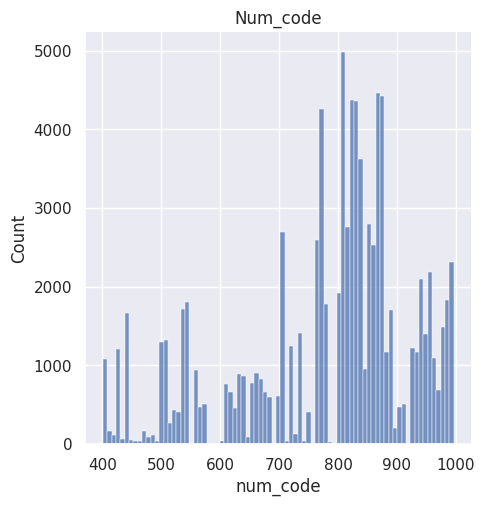

In [17]:
sns.set()
plt.figure(figsize=(6,6))
sns.displot(flight['num_code'])
plt.title('Num_code')
plt.show()

In [18]:
flight['airline'].value_counts()

airline
Vistara      60589
Air India    32898
Name: count, dtype: int64

### ***This is the count plot of Airline***

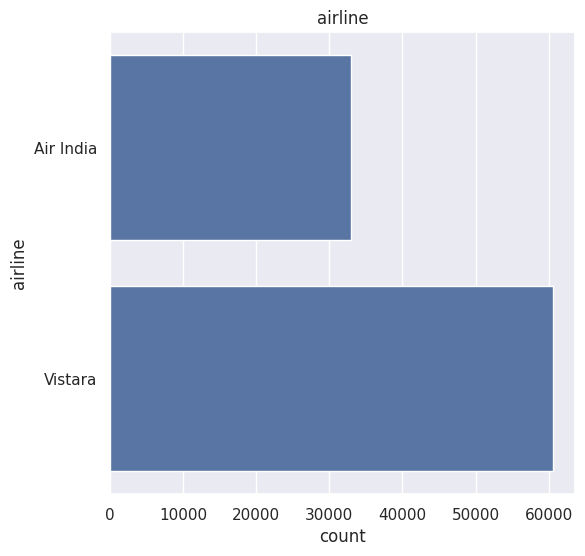

In [19]:
plt.figure(figsize=(6,6))
sns.countplot(flight['airline'])
plt.title('airline')
plt.show()

In [20]:
flight['ch_code'].value_counts()

ch_code
UK    60589
AI    32898
Name: count, dtype: int64

### ***This isn the count plot of ch_code***

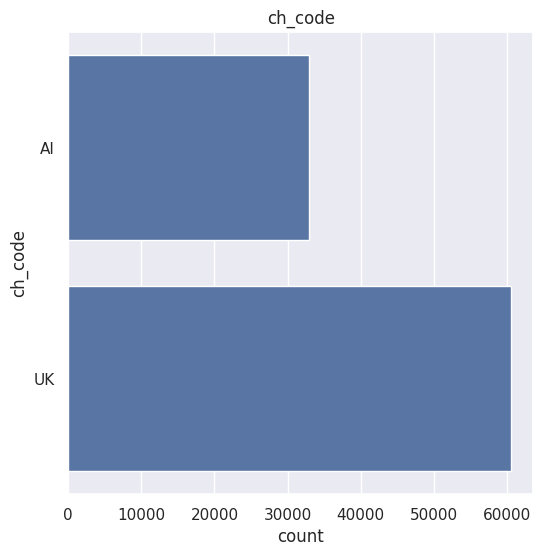

In [21]:
plt.figure(figsize=(6,6))
sns.countplot(flight['ch_code'])
plt.title('ch_code')
plt.show()

### ***This is the distribution plot of Price of tickets***

<ipython-input-25-32fab74d19c8>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(flight['price'])


<Axes: xlabel='price', ylabel='Density'>

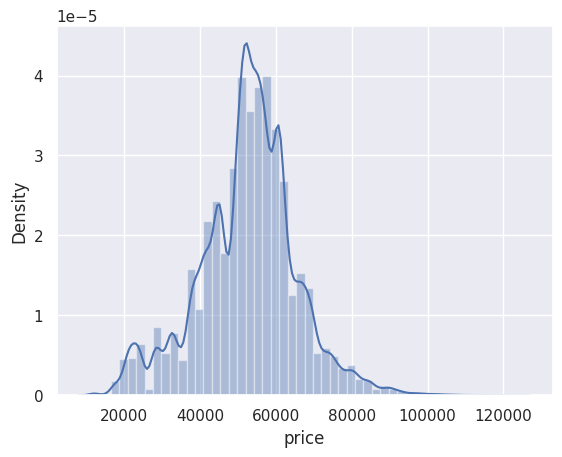

In [25]:
sns.distplot(flight['price'])

In [26]:
flight['from'].value_counts()

from
Mumbai       19858
Delhi        18316
Bangalore    16441
Kolkata      13473
Hyderabad    12870
Chennai      12529
Name: count, dtype: int64

In [27]:
flight['to'].value_counts()

to
Mumbai       18991
Delhi        16707
Bangalore    16198
Kolkata      14758
Hyderabad    13675
Chennai      13158
Name: count, dtype: int64

In [28]:
flight['stop'].value_counts()

stop
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t\t\t\t\t\t\t                   81489
non-stop                                                                      8102
2+-stop                                                                       1083
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia IDR\n\t\t\t\t\t\t\t\t\t\t\t\t              810
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia IXU\n\t\t\t\t\t\t\t\t\t\t\t\t              776
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia PAT\n\t\t\t\t\t\t\t\t\t\t\t\t              257
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Patna\n\t\t\t\t\t\t\t\t\t\t\t\t            242
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia BBI\n\t\t\t\t\t\t\t\t\t\t\t\t              152
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia STV\n\t\t\t\t\t\t\t\t\t\t\t\t               93
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia IXE\n\t\t\t\t\t\t\t\t\t\t\t\t               86
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Bhubaneswar\n\t\t\t\t\t\t\t\t\t\t\t\t       75
1-stop\n\t\t\t\t\t\t\t\t\t\t\t\tVia Hyderabad\n\t\t\t\t\t\t\t\t\t\t\t\t         71

# ***Encoding the categorical features***

In [29]:
#ENCODING THE Airline COLUMN
flight.replace({'airline':{'Vistara':0, 'Air India':1}}, inplace=True)

#ENCODING THE ch_code COLUMN
flight.replace({'ch_code': {'UK': 0, 'AI': 1}}, inplace=True)


#ENCODING THE from COLUMN
flight.replace({'from':{'Mumbai':0, 'Delhi':1,'Bangalore':2,'Kolkata':3,'Hyderabad':4,'Chennai':5}}, inplace=True)

#Encoding the To column
flight.replace({'to':{'Mumbai':0, 'Delhi':1,'Bangalore':2,'Kolkata':3,'Hyderabad':4,'Chennai':5}}, inplace=True)

In [30]:
flight.head()

,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,day,month,year
0,1,1,868,18.000000,1,2.000000,non-stop,20.000000,0,25612.0,11,2,2022
1,1,1,624,19.000000,1,2.250000,non-stop,21.250000,0,25612.0,11,2,2022
2,1,1,531,20.000000,1,24.750000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20.750000,0,42220.0,11,2,2022
3,1,1,839,21.416667,1,26.500000,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23.916667,0,44450.0,11,2,2022
4,1,1,544,17.250000,1,6.666667,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23.916667,0,46690.0,11,2,2022


## ***Splitting the features and target***

In [31]:
x=flight.drop(['stop','price'],axis=1)
y=flight['price']

In [32]:
print(x)

       airline  ch_code  num_code   dep_time  from  time_taken   arr_time  to  \
0            1        1       868  18.000000     1    2.000000  20.000000   0   
1            1        1       624  19.000000     1    2.250000  21.250000   0   
2            1        1       531  20.000000     1   24.750000  20.750000   0   
3            1        1       839  21.416667     1   26.500000  23.916667   0   
4            1        1       544  17.250000     1    6.666667  23.916667   0   
...        ...      ...       ...        ...   ...         ...        ...  ..   
93482        0        0       822   9.750000     5   10.083333  19.833333   4   
93483        0        0       826  12.500000     5   10.416667  22.916667   4   
93484        0        0       832   7.083333     5   13.833333  20.916667   4   
93485        0        0       828   7.000000     5   10.000000  17.000000   4   
93486        0        0       822   9.750000     5   10.083333  19.833333   4   

       day  month  year  
0

In [33]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93487 entries, 0 to 93486
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   airline     93487 non-null  int64  
 1   ch_code     93487 non-null  int64  
 2   num_code    93487 non-null  int64  
 3   dep_time    93487 non-null  float64
 4   from        93487 non-null  int64  
 5   time_taken  93487 non-null  float64
 6   arr_time    93487 non-null  float64
 7   to          93487 non-null  int64  
 8   day         93487 non-null  int64  
 9   month       93487 non-null  int64  
 10  year        93487 non-null  int64  
dtypes: float64(3), int64(8)
memory usage: 7.8 MB


In [34]:
print(y)

0        25612.0
1        25612.0
2        42220.0
3        44450.0
4        46690.0
          ...   
93482    69265.0
93483    77105.0
93484    79099.0
93485    81585.0
93486    81585.0
Name: price, Length: 93487, dtype: float64


# ***Splitting the data into training data testing data***

In [35]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.2,random_state=2)

In [36]:
print(x.shape,x_train.shape,x_test.shape)

(93487, 11) (74789, 11) (18698, 11)


# ***Model Training***

In [37]:
model=LinearRegression()

In [38]:
model.fit(x_train,y_train)

LinearRegression()

Model Evaluation

In [40]:
training_data_prediction=model.predict(x_train)

In [42]:
r2_train=metrics.r2_score(y_train,training_data_prediction)
print('R squared value:',r2_train)

R squared value: 0.19295122037012713


In [43]:
test_data_prediction=model.predict(x_test)

In [44]:
r2_test=metrics.r2_score(y_test,test_data_prediction)
print('R squared value:',r2_test)

R squared value: 0.1896163926423946


# ***Predicting***

In [54]:
airline=input("enter the airline - Vistara/Air India:")
if airline=="Vistara":
  airline1=0
else:
  airline1=1
ch_code=input("enter the ch code - UK/AI:")
if ch_code=="UK":
  ch_code1=0
else:
  ch_code1=1
num_code=int(input("enter numcode:"))
dep_time=float(input("enter departure time:"))
from2 = input("enter the place of departure:")
if from2 =="Mumbai":
  from1=0
elif from2 =="Delhi":
  from1=1
elif from2 =="Bangalore":
  from1=2
elif from2 =="Kolkata":
  from1=3
elif from2 =="Hyderbad":
  from1=4
else:
  from1=5
time_taken=float(input('enter time taken:'))
arr_time=float(input("enter arrival time:"))
to=input("enter the destination place")
if to=="Mumbai":
  to1=0
elif to=="Delhi":
  to=1
elif to=="Bangalore":
  to1=2
elif to=="Kolkata":
  to1=3
elif to=="Hyderbad":
  to1=4
else:
  to1=5
day=int(input('enter day:'))
month=int(input('enter month:'))
year=int(input('enter year:'))

enter the airline - Vistara/Air India:1
enter the ch code - UK/AI:0
enter numcode:528
enter departure time:18.00
enter the place of departure:1
enter time taken:2.00
enter arrival time:20.00
enter the destination place0
enter day:11
enter month:2
enter year:2022


In [56]:
userdata=[airline1,ch_code1,num_code,dep_time,from1,time_taken,arr_time,to1,day,month,year]
prediction=model.predict([userdata])
print(prediction)

print('The predicted ticket price for this input data is {prediction}')

[42596.63360789]
The predicted ticket price for this input data is {prediction}


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


## ***The predicted ticket fare for the inputed data is 42596.63360789***